<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#The-dataset..." data-toc-modified-id="The-dataset...-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>The dataset...</a></span></li><li><span><a href="#Import-required-modules" data-toc-modified-id="Import-required-modules-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Import required modules</a></span></li><li><span><a href="#Webscraping-and-APIs..." data-toc-modified-id="Webscraping-and-APIs...-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Webscraping and APIs...</a></span></li><li><span><a href="#Retrieval" data-toc-modified-id="Retrieval-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Retrieval</a></span><ul class="toc-item"><li><span><a href="#NewsAPI---initialisation" data-toc-modified-id="NewsAPI---initialisation-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>NewsAPI - initialisation</a></span></li><li><span><a href="#Grab-your-API-key" data-toc-modified-id="Grab-your-API-key-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Grab your API key</a></span></li><li><span><a href="#get_everything()-method" data-toc-modified-id="get_everything()-method-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>get_everything() method</a></span></li><li><span><a href="#Results---JSON-object" data-toc-modified-id="Results---JSON-object-4.4"><span class="toc-item-num">4.4&nbsp;&nbsp;</span>Results - JSON object</a></span></li><li><span><a href="#Building-a-pandas-DataFrame" data-toc-modified-id="Building-a-pandas-DataFrame-4.5"><span class="toc-item-num">4.5&nbsp;&nbsp;</span>Building a pandas DataFrame</a></span></li></ul></li></ul></div>

In [1]:
# API key = cd716c442d1f48408aafb24eca509e2f

## The dataset...

In this notebook, we won't be working with a pre-existing dataset, we'll be building one ourselves! We will be using an API and some webscraping to create a pandas DataFrame containing our online articles, and the text content that we wish to do some text-mining with. If that sounds weird, fear not, I'll explain as we go along.

Below I've commented out some code that I no longer need, as I have already installed these packages.
Go ahead and uncomment this code and make sure you install each one before you begin.

In [4]:

# !pip install pandas
# !pip install newsapi-python
# !pip install datetime
# !pip install requests
# !pip install bs4

## Import required modules

The first package 'newsapi' requires you to go to the following link https://newsapi.org/ and create a free account. You can then generate your API key, which you will need to locate your news articles.

In [3]:
import nltk
from nltk import word_tokenize
 # nltk stands for natural language tool kit and is useful for text-mining

from newsapi import NewsApiClient
# NewsAPI package allows us to use their API which returns search results for news articles

import pandas as pd
# includes useful functions for manipulating data 

import re
# re is for regular expressions, which we use later 

import datetime as dt
# supplies classes for manipulating dates and times

import requests
# allows us to send HTTP requests using Python - we will need this for webscraping!

from bs4 import BeautifulSoup
# contains functions that help us pull content from webpages and save that info into something more readable
# ...again, important for webscraping!

## Webscraping and APIs...

Webscraping refers to the extraction of data from a website. This information is collected and then exported into a format that is more useful, perhaps a spreadsheet. Of course, we could just copy and paste this information manually into a spreadsheet, but that's time-consuming and unreasonable if we want to extract large amounts of data. Instead, we can use Python webscraping packages to access the information we want and display it in a logical format.

API stands for 'Application programming interface', and refers to a mechanism that allows two software components to communicate with each other using a set of definitions and protocals. Basically, it allows two applications to talk to each other. For instance, think of your Weather app on your phone, this app software "talks" to the weather bureau's software system which contains the daily weather data. The result of this conversation is daily weather updates on your phone. 

Both webscraping (as a process) and APIs (as a set of procedures and protocals) share the same goal: to access web data. The former allows you to extract data from any website via scraping software, whilst the latter gives you direct access to the data you want. In this notebook I'll be using a combination of the two.

## Retrieval

Text-Mining has four basic steps: retrieval, processing, extraction, and analysis. 
During the retrieval stage we retrieve information, i.e., we gather the text data that we wish to work with. In this case, we're looking for articles that focus on women's football, and in particular, the WSL (Women's Super League). I'd also like to build up a dataset which focuses on men's football too, which looks at the Premier League. 

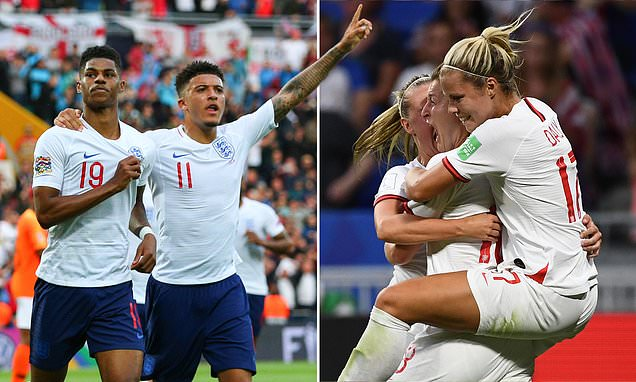

### NewsAPI - initialisation

So before I can even begin to think about webscraping, I need to locate some relevant data. I could just type "women's football WSL" into google and click on each individual link and try to scrape this data... but again, that's a) time-consuming b) uncreative. Instead, I did a brief google search "Scrape news articles Python" and came across NewsAPI. This API returns search results for current and historic news articles, and the results include information on: title, author, source, date, and url of the news article. It also allows you to input multiple terms so that you can grab as many relevant links as you can! 

Neat. Let's get started then.

### Grab your API key

In the section under 'Import required modules' I mentioned that you'll need to visit this link  https://newsapi.org/ and create a free account. So if you haven't done so, do it now! You can then generate your API key, which you will need to locate your news articles.

In [7]:
# Initialise the client class with your API key:

newsapi = NewsApiClient(api_key='cd716c442d1f48408aafb24eca509e2f')

In [8]:
# Here, I print the instance of my NewsApiClient class... it has 3 methods:
# get_top_headlines(), get_everything(), and get_sources()

newsapi

### get_everything() method

Because we don't want our search results restricted to the top headlines, we will be using the get_everything() method. 

The get_everything() method has the following parameters:

* apiKey (required)
* q - keywords or phrases to search for in the article title and body. Supports advanced search e.g. you can use the AND / OR / NOT keywords 
* sources - if you want to specify which news sources or blogs you want headlines from e.g. bbc
* from - a date and optional time for the oldest article allowed
* to - a date and optional time for the newest article allowed
* language - the language you want your articles in
* sortBy - defines how your results are returned, options include 'relevancy' so that articles most closely related to 'q' come first

NOTE: Unfortunately in the free version of the NewsAPI I can't restrict by date. So I can only pull articles from 31st October. I would have liked to specify a timeframe for women's football that corresponded to last years WSL, and the same for the men's premier league. Alas, we march onwards. 

In [20]:
# Create a variable called 'womens'
# Use get_everything() method with my topic set to include the "womens super league" and the "WSL"...
# helps to capture results that use the abbrieviation 

womens = newsapi.get_everything(q = "women super league AND WSL", language = 'en')

### Results - JSON object

Below I have printed the result for my get_everything() search, and I know what you're thinking.. ew, gross! Yep, we have a dictionary result for each article which contains the title, author, source, date of publish, and the url. But, this format isn't the best. Dictionarys are made up of key/value pairs, so what we can do is extract the relevant information and then place it into a DataFrame.

We probably want the keys as column headings and our values inserted in the rows.
 

In [24]:
# Let's take a look at our results...

womens

{'status': 'ok',
 'totalResults': 0,
 'articles': [{'title': 'Women’s Super League: talking points from the weekend’s action',
   'author': 'Suzanne Wrack, Sophie Downey and Sarah Rendell',
   'source': {'Id': None, 'Name': 'The Guardian'},
   'publishedAt': '2022-11-21T12:01:31Z',
   'url': 'https://www.theguardian.com/football/2022/nov/21/womens-super-league-talking-points-from-the-weekends-action'},
  {'title': 'Moving the Goalposts | ‘We want to keep dreaming’ – the rise and rise of Roma Women',
   'author': 'Sophie Downey',
   'source': {'Id': None, 'Name': 'The Guardian'},
   'publishedAt': '2022-12-07T11:45:23Z',
   'url': 'https://www.theguardian.com/football/2022/dec/07/we-want-to-keep-dreaming-the-rise-and-rise-of-roma-women'},
  {'title': 'Leicester’s Ashleigh Plumptre: ‘I love everything about being in Nigeria’',
   'author': 'Ella Braidwood',
   'source': {'Id': None, 'Name': 'The Guardian'},
   'publishedAt': '2022-11-17T11:33:58Z',
   'url': 'https://www.theguardian.com/

In [26]:
# I have created 5 empty lists for our dictionary keys

headlines = []
author = []
source = []
date = []
url = []

# first I will use a for loop to interate over the 'articles' list which contains the relevant dictionary
# the get() method returns the value of the item with the specified key
for i in womens.get("articles"):
#  then I access the "title" key using get() and append the value to the empty headlines list   
    headlines.append(i.get("title"))
#     repeat for author, date, and url
    author.append(i.get("author"))
#    source contains another dictionary which includes 'Id' and 'Name'
# here we just want 'Name', so first we access the source key and name this variable 'source_dict'
    source_dict = (i.get("source"))
#     then we enter our source dictionary and access the 'Name' value for each article
    source.append(source_dict.get("Name"))
    date.append(i.get("publishedAt"))
    url.append(i.get("url"))

# Let's take a look at our url list

url

# Nice, looking good. Let's see if we can get all of our list info into a snazzy looking DataFrame. 

['https://www.theguardian.com/football/2022/nov/21/womens-super-league-talking-points-from-the-weekends-action',
 'https://www.theguardian.com/football/2022/dec/07/we-want-to-keep-dreaming-the-rise-and-rise-of-roma-women',
 'https://www.theguardian.com/football/2022/nov/17/leicester-ashleigh-plumptre-nigeria',
 'https://www.bbc.co.uk/sport/football/63606404',
 'https://www.bbc.co.uk/sport/football/63771047',
 'https://www.bbc.co.uk/sport/football/63612799',
 'https://www.bbc.co.uk/sport/football/63765147',
 'https://www.bbc.co.uk/sport/football/63697262',
 'https://www.bbc.co.uk/sport/football/63606405',
 'https://www.bbc.co.uk/sport/football/63765142',
 'https://www.skysports.com/football/news/35730/12746755/polly-bancroft-exclusive-manchester-united-women-ahead-of-curve-with-new-head-of-womens-football-role',
 'https://www.bbc.co.uk/sport/football/63691567',
 'https://www.bbc.co.uk/sport/football/62784258',
 'https://www.skysports.com/football/news/11095/12748880/khadija-bunny-shaw-h

### Building a pandas DataFrame

Below, we have used the lists we created by iterating over the 'womens' dictionary, to build our DataFrame. But, you'll notice some things that you might want to change, for instance the 'Date' column isn't in the best format. This is an issue we can tackle in the next stage of our text-mining process: processing.

In [28]:
# First, let's create a dictionary called 'd'
# In it we'll place our column names and their corresponding lists that we built in the previous cell

d = {'Headlines': headlines, 'Source': source, 'Author': author, 'Date': date, 'Link': url}

# Next, we create a DataFrame object called 'df' and in the 'data' parameter set it to our dictionary 'd'
df = pd.DataFrame(data=d)

# Let's go ahead and view the results
df.head()
# the head() method prints the first 5 rows of our dataframe

,Headlines,Source,Author,Date,Link
0,Women’s Super League: talking points from the ...,The Guardian,"Suzanne Wrack, Sophie Downey and Sarah Rendell",2022-11-21T12:01:31Z,https://www.theguardian.com/football/2022/nov/...
1,Moving the Goalposts | ‘We want to keep dreami...,The Guardian,Sophie Downey,2022-12-07T11:45:23Z,https://www.theguardian.com/football/2022/dec/...
2,Leicester’s Ashleigh Plumptre: ‘I love everyth...,The Guardian,Ella Braidwood,2022-11-17T11:33:58Z,https://www.theguardian.com/football/2022/nov/...
3,Shaw stars for Man City in WSL win at Everton,BBC News,None,2022-11-19T17:01:41Z,https://www.bbc.co.uk/sport/football/63606404
4,Man City win keeps pressure on WSL top three,BBC News,None,2022-12-04T16:12:15Z,https://www.bbc.co.uk/sport/football/63771047


In [29]:
# df['Date'] = df['Date'].str.extract(r'(\d{4}-\d{2}-\d{2})')
# df

## Webscraping

Now that we have some links that are relevant to our topic of focus the 'women's super league', we can start to scrape the text content of these articles! We will do so with the requests package (which allows us to send HTTP requests using Python), and the BeautifulSoup package (which helps us pull data out of HTML files).

**NOTE: GOOGLE IS YOUR FRIEND**

Like all good computational social science folk, I know that I don't need to be an expert in everything. In fact, a good skill to build when you're doing computational work, is effective googling. I could claim that I built all of this code alone with my own knowledge + cleverness, but that would be a lie! Instead, like most projects, this has been a learning experience and I have incorporated useful bits of code to help get the job done. The function outlined below was found on the following stackoverflow forum (https://stackoverflow.com/questions/70753206/download-and-extract-only-news-from-bbc) and was the result of a google search ("Python scrape news articles BBC") - at the time I thought I might limit my results to just BBC articles.

I took some time to get to grips with it, and then tweaked it to fit my text-mining purposes! 

In [36]:

# create empty list which will hold the text content of each article
text = []

# create function which has a parameter for our urls
def get_page(url):

#     I'd like to print each url out
    print("URL:", url)

#   first I make a requests.get response for each url
# this returns a requests.Response() object which contains the servers response to the HTTP request
    response = requests.get(url)


#   we then run the response.text from the request through Beautiful Soup which gives us a BeautifulSoup object
# this represents the document as a nested data structure 
# we use the features parameter to choose how to parse the HTML - I'm using 'lxml'
    soup = BeautifulSoup(response.text, features='lxml')
    
    print("SOUP", soup)
#     head = soup.find('h1', {"id": "main-heading"}) or soup.find('div', {'class': 'article-headline__text b-reith-sans-font b-font-weight-300'}) or soup.find('title')
#     heading = head.string
#     headings.append(heading)
#     print("HEADING", heading)

    blocks = []
#     for block in soup.find_all('div', {"data-component": "text-block"}) or soup.find_all('div', {"class": "body-text-card b-reith-sans-font"}) or soup.find_all('div', {"class": "ssrcss-1n5sg88-StyledSummary elwf6ac3"}) or soup.find_all('h3', {"class": "lx-stream-post__header-title gel-great-primer-bold qa-post-title gs-u-mt0 gs-u-mb-"}):
    for block in soup.find_all('p'):
        blocks.append(block.getText())
    print("BLOCKS", blocks)

    text.append(blocks)

    return text

URL: https://www.theguardian.com/football/2022/nov/21/womens-super-league-talking-points-from-the-weekends-action
RESPONSE.TEXT <!doctype html>
        <html lang="en">
            <head>
			    
<!--

We are hiring, ever thought about joining us?
https://workforus.theguardian.com/careers/product-engineering/


                                    GGGGGGGGG
                           GGGGGGGGGGGGGGGGGGGGGGGGGG
                       GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG
                    GGGGGGGGGGGGGGGGG      GG   GGGGGGGGGGGGG
                  GGGGGGGGGGGG        GGGGGGGGG      GGGGGGGGGG
                GGGGGGGGGGG         GGGGGGGGGGGGG       GGGGGGGGG
              GGGGGGGGGG          GGGGGGGGGGGGGGGGG     GGGGGGGGGGG
             GGGGGGGGG           GGGGGGGGGGGGGGGGGGG    GGGGGGGGGGGG
            GGGGGGGGG           GGGGGGGGGGGGGGGGGGGGGG  GGGGGGGGGGGGG
           GGGGGGGGG            GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG
           GGGGGGGG             GGGGGGGGGGGGGGGGGGGGGGGGGG

RESPONSE.TEXT <!doctype html>
        <html lang="en">
            <head>
			    
<!--

We are hiring, ever thought about joining us?
https://workforus.theguardian.com/careers/product-engineering/


                                    GGGGGGGGG
                           GGGGGGGGGGGGGGGGGGGGGGGGGG
                       GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG
                    GGGGGGGGGGGGGGGGG      GG   GGGGGGGGGGGGG
                  GGGGGGGGGGGG        GGGGGGGGG      GGGGGGGGGG
                GGGGGGGGGGG         GGGGGGGGGGGGG       GGGGGGGGG
              GGGGGGGGGG          GGGGGGGGGGGGGGGGG     GGGGGGGGGGG
             GGGGGGGGG           GGGGGGGGGGGGGGGGGGG    GGGGGGGGGGGG
            GGGGGGGGG           GGGGGGGGGGGGGGGGGGGGGG  GGGGGGGGGGGGG
           GGGGGGGGG            GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG
           GGGGGGGG             GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG
          GGGGGGGG              GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG
          GGGGGGGG           

RESPONSE.TEXT <!doctype html>
        <html lang="en">
            <head>
			    
<!--

We are hiring, ever thought about joining us?
https://workforus.theguardian.com/careers/product-engineering/


                                    GGGGGGGGG
                           GGGGGGGGGGGGGGGGGGGGGGGGGG
                       GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG
                    GGGGGGGGGGGGGGGGG      GG   GGGGGGGGGGGGG
                  GGGGGGGGGGGG        GGGGGGGGG      GGGGGGGGGG
                GGGGGGGGGGG         GGGGGGGGGGGGG       GGGGGGGGG
              GGGGGGGGGG          GGGGGGGGGGGGGGGGG     GGGGGGGGGGG
             GGGGGGGGG           GGGGGGGGGGGGGGGGGGG    GGGGGGGGGGGG
            GGGGGGGGG           GGGGGGGGGGGGGGGGGGGGGG  GGGGGGGGGGGGG
           GGGGGGGGG            GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG
           GGGGGGGG             GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG
          GGGGGGGG              GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG
          GGGGGGGG           

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



RESPONSE.TEXT <!DOCTYPE html>
<html lang="en" class="no-js">
<head>
  
      <meta charset="utf-8">
      <title>Polly Bancroft exclusive: Manchester United Women ahead of curve with new &#x27;Head of Women’s Football&#x27; role | Football News | Sky Sports</title>
    
      <meta name="robots" content="index, follow, max-snippet:-1, max-image-preview:large, max-video-preview:-1">
      
      <meta name="title" content="Polly Bancroft exclusive: Manchester United Women ahead of curve with new &#x27;Head of Women’s Football&#x27; role | Football News | Sky Sports">
      <meta name="description" content="This club know how to do football, says Manchester Uniteds new Head of Women’s Football, Polly Bancroft, in an exclusive interview with Sky Sports; watch Arsenal vs Man Utd live on Sky Sports Main Event on Saturday; kick-off 5.30pm ">
      <meta name="keywords" content="">
      <meta http-equiv="X-UA-Compatible" content="IE=edge,chrome=1">
      
      <link rel="manifest" href="/as

RESPONSE.TEXT <!DOCTYPE html>
<html lang="en-GB" class="b-reith-sans-font">
  <head>
    <script>window.Morph = {}</script>
<script type="text/javascript">Morph.markPerformance = function(label) { if(window.performance && window.performance.mark) { window.performance.mark(label); } }; Morph.versions = {}; Morph.modules = {}; Morph.config = { cdn: "m.files.bbci.co.uk", pushEnv: "live" }; Morph.styles = {}; Morph.styleSrc = []; Morph.toInit = {bundles: [], registers: [], payloads: []};   Morph.initStyles = function() { if (!Morph.enhanced) { var eles = Array.prototype.slice.call(document.getElementsByTagName('noscript')); for (var i = 0, len = eles.length; i<len; i++) { if (eles[i].className === 'morph-core-style') { document.write(eles[i].innerText); eles[i].parentNode.removeChild(eles[i]); } } return; } for (var j = 0, jLen = Morph.styleSrc.length; j<jLen; j++) { document.write(Morph.styleSrc[j]); } Morph.styleSrc = []; };</script>
<script type="text/javascript">Morph.forceCore = windo
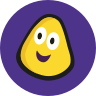
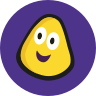

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



RESPONSE.TEXT <!DOCTYPE html>
<html lang="en-GB" class="articleRendererHTML no-js">

	
	
	
	
	
	
	
	
	
	
	
        
            
                
                
                
            

        
                
            
        
            
                
            
    
<head>
<meta charset="UTF-8"/>
<meta name="viewport" content="width=device-width, initial-scale=1, user-scalable=yes"/>

		
	
<title>Exclusive: Brighton Women line up former Bayern Munich manager</title>
<!-- Google Services (Showcase and Subscribe) -->

	
		
			
					
				
		
<script data-pagespeed-no-defer>//<![CDATA[
(function(){function d(b){var a=window;if(a.addEventListener)a.addEventListener("load",b,!1);else if(a.attachEvent)a.attachEvent("onload",b);else{var c=a.onload;a.onload=function(){b.call(this);c&&c.call(this)}}}var p=Date.now||function(){return+new Date};window.pagespeed=window.pagespeed||{};var q=window.pagespeed;function r(){this.a=!0}r.prototype.c=function(b){b=parseInt(b.substring

RESPONSE.TEXT <!DOCTYPE html>
<html lang="en" class="no-js">
<head>
  
      <meta charset="utf-8">
      <title>Manuela Zinsberger exclusive: Becoming a goalkeeper, Arsenal Women&#x27;s team mentality and Emirates Stadium &#x27;love&#x27;  | Football News | Sky Sports</title>
    
      <meta name="robots" content="index, follow, max-snippet:-1, max-image-preview:large, max-video-preview:-1">
      
      <meta name="title" content="Manuela Zinsberger exclusive: Becoming a goalkeeper, Arsenal Women&#x27;s team mentality and Emirates Stadium &#x27;love&#x27;  | Football News | Sky Sports">
      <meta name="description" content="Plus: Beating Lyon on her 27th birthday; the test her Dad made her take to become a goalkeeper; how she has improved since joining Arsenal; watch Arsenal vs Man Utd live on Sky Sports Premier League, Football and Main Event from 5.15pm; kick-off 5.30pm">
      <meta name="keywords" content="">
      <meta http-equiv="X-UA-Compatible" content="IE=edge,chrome=1">

RESPONSE.TEXT <!DOCTYPE html>
<!--[if lt IE 7 ]> <html xmlns="http://www.w3.org/1999/xhtml" xmlns:og="http://opengraphprotocol.org/schema/" prefix="og: http://ogp.me/ns#" id="top" class="no-js ie6 oldie"> <![endif]-->
<!--[if IE 7 ]>    <html xmlns="http://www.w3.org/1999/xhtml" xmlns:og="http://opengraphprotocol.org/schema/" prefix="og: http://ogp.me/ns#" id="top" class="no-js ie7 oldie"> <![endif]-->
<!--[if IE 8 ]>    <html xmlns="http://www.w3.org/1999/xhtml" xmlns:og="http://opengraphprotocol.org/schema/" prefix="og: http://ogp.me/ns#" id="top" class="no-js ie8 oldie"> <![endif]-->
<!--[if IE 9 ]>    <html xmlns="http://www.w3.org/1999/xhtml" xmlns:og="http://opengraphprotocol.org/schema/" prefix="og: http://ogp.me/ns#" id="top" class="no-js ie9"> <![endif]-->
<!--[if (gt IE 9)|!(IE)]><!--> <html id="top" class="no-js"> <!--<![endif]-->
<script>
    (function(H){H.className=H.className.replace(/\bno-js\b/,'js')})(document.documentElement);

    if (window.history.replaceState && w

RESPONSE.TEXT <!DOCTYPE html>
<html lang="en-GB" class="articleRendererHTML no-js">

	
	
	
	
	
	
	
	
	
	
	
        
            
                
                
                
            

        
                
            
        
            
                
            
    
<head>
<meta charset="UTF-8"/>
<meta name="viewport" content="width=device-width, initial-scale=1, user-scalable=yes"/>

		
	
<title>Grass-roots football craves more than a Euro boost</title>
<!-- Google Services (Showcase and Subscribe) -->

	
		
			
					
				
		
<script data-pagespeed-no-defer>//<![CDATA[
(function(){function d(b){var a=window;if(a.addEventListener)a.addEventListener("load",b,!1);else if(a.attachEvent)a.attachEvent("onload",b);else{var c=a.onload;a.onload=function(){b.call(this);c&&c.call(this)}}}var p=Date.now||function(){return+new Date};window.pagespeed=window.pagespeed||{};var q=window.pagespeed;function r(){this.a=!0}r.prototype.c=function(b){b=parseInt(b.substring(0,b.indexOf

RESPONSE.TEXT <!DOCTYPE html>
<html lang="en-GB" class="articleRendererHTML no-js">

	
	
	
	
	
	
	
	
	
	
	
        
            
                
                
                
            

        
                
            
        
            
                
            
    
<head>
<meta charset="UTF-8"/>
<meta name="viewport" content="width=device-width, initial-scale=1, user-scalable=yes"/>

		
	
<title>Exclusive: Arsenal want women&#39;s side to play every game at Emirates</title>
<!-- Google Services (Showcase and Subscribe) -->

	
		
			
					
				
		
<script data-pagespeed-no-defer>//<![CDATA[
(function(){function d(b){var a=window;if(a.addEventListener)a.addEventListener("load",b,!1);else if(a.attachEvent)a.attachEvent("onload",b);else{var c=a.onload;a.onload=function(){b.call(this);c&&c.call(this)}}}var p=Date.now||function(){return+new Date};window.pagespeed=window.pagespeed||{};var q=window.pagespeed;function r(){this.a=!0}r.prototype.c=function(b){b=parseInt(b.

RESPONSE.TEXT <!DOCTYPE html>
<html lang="en" class="no-js">
<head>
  
      <meta charset="utf-8">
      <title>Reading Women goalkeeper Jacqueline Burns reveals how US college football prepared her for professional game | Football News | Sky Sports</title>
    
      <meta name="robots" content="index, follow, max-snippet:-1, max-image-preview:large, max-video-preview:-1">
      
      <meta name="title" content="Reading Women goalkeeper Jacqueline Burns reveals how US college football prepared her for professional game | Football News | Sky Sports">
      <meta name="description" content="Plus: Readings start to the WSL season and Northern Irelands landmark 2022 after Euro 2022 debut; Watch Chelsea Women vs Reading Women on Sunday from 6.30pm, live on Sky Sports Premier League and Main Event">
      <meta name="keywords" content="">
      <meta http-equiv="X-UA-Compatible" content="IE=edge,chrome=1">
      
      <link rel="manifest" href="/assets/manifest.json" crossOrigin="use-cre

RESPONSE.TEXT <html style="height:100%"><head><META NAME="ROBOTS" CONTENT="NOINDEX, NOFOLLOW"><meta name="format-detection" content="telephone=no"><meta name="viewport" content="initial-scale=1.0"><meta http-equiv="X-UA-Compatible" content="IE=edge,chrome=1"><script src="/vnmake-Thane-it-sloppily-Macd-With-my-It-welliou" async></script></head><body style="margin:0px;height:100%"><iframe id="main-iframe" src="/_Incapsula_Resource?CWUDNSAI=23&xinfo=13-155908882-0%200NNN%20RT%281670604394746%2046352%29%20q%280%20-1%20-1%20-1%29%20r%280%20-1%29%20B15%2811%2c1659799%2c0%29%20U5&incident_id=1609000180575157462-760913487349744781&edet=15&cinfo=0b000000&rpinfo=0&cip=86.160.54.171&mth=GET" frameborder=0 width="100%" height="100%" marginheight="0px" marginwidth="0px">Request unsuccessful. Incapsula incident ID: 1609000180575157462-760913487349744781</iframe></body></html>
SOUP <html style="height:100%"><head><meta content="NOINDEX, NOFOLLOW" name="ROBOTS"/><meta content="telephone=no" name="form

RESPONSE.TEXT <html>
<head><title>403 Forbidden</title></head>
<body>
<center><h1>403 Forbidden</h1></center>
<hr><center>nginx</center>
</body>
</html>

SOUP <html>
<head><title>403 Forbidden</title></head>
<body>
<center><h1>403 Forbidden</h1></center>
<hr/><center>nginx</center>
</body>
</html>

BLOCKS []
TEXT LENGTH: 23

URL: https://www.skysports.com/football/news/11095/12746475/diversity-in-womens-football-game-must-show-desire-for-change-beth-mead-comments-labelled-a-bit-uneducated
RESPONSE.TEXT <!DOCTYPE html>
<html lang="en" class="no-js">
<head>
  
      <meta charset="utf-8">
      <title>Diversity in women&#x27;s football: Game must &#x27;show desire for change&#x27; | Beth Mead comments labelled &#x27;a bit uneducated&#x27; | Football News | Sky Sports</title>
    
      <meta name="robots" content="index, follow, max-snippet:-1, max-image-preview:large, max-video-preview:-1">
      
      <meta name="title" content="Diversity in women&#x27;s football: Game must &#x27;show

RESPONSE.TEXT <!DOCTYPE html>
<!--[if lt IE 7 ]> <html xmlns="http://www.w3.org/1999/xhtml" xmlns:og="http://opengraphprotocol.org/schema/" prefix="og: http://ogp.me/ns#" id="top" class="no-js ie6 oldie"> <![endif]-->
<!--[if IE 7 ]>    <html xmlns="http://www.w3.org/1999/xhtml" xmlns:og="http://opengraphprotocol.org/schema/" prefix="og: http://ogp.me/ns#" id="top" class="no-js ie7 oldie"> <![endif]-->
<!--[if IE 8 ]>    <html xmlns="http://www.w3.org/1999/xhtml" xmlns:og="http://opengraphprotocol.org/schema/" prefix="og: http://ogp.me/ns#" id="top" class="no-js ie8 oldie"> <![endif]-->
<!--[if IE 9 ]>    <html xmlns="http://www.w3.org/1999/xhtml" xmlns:og="http://opengraphprotocol.org/schema/" prefix="og: http://ogp.me/ns#" id="top" class="no-js ie9"> <![endif]-->
<!--[if (gt IE 9)|!(IE)]><!--> <html id="top" class="no-js"> <!--<![endif]-->
<script>
    (function(H){H.className=H.className.replace(/\bno-js\b/,'js')})(document.documentElement);

    if (window.history.replaceState && w

RESPONSE.TEXT <!DOCTYPE html>
<!--[if lt IE 7 ]> <html xmlns="http://www.w3.org/1999/xhtml" xmlns:og="http://opengraphprotocol.org/schema/" prefix="og: http://ogp.me/ns#" id="top" class="no-js ie6 oldie"> <![endif]-->
<!--[if IE 7 ]>    <html xmlns="http://www.w3.org/1999/xhtml" xmlns:og="http://opengraphprotocol.org/schema/" prefix="og: http://ogp.me/ns#" id="top" class="no-js ie7 oldie"> <![endif]-->
<!--[if IE 8 ]>    <html xmlns="http://www.w3.org/1999/xhtml" xmlns:og="http://opengraphprotocol.org/schema/" prefix="og: http://ogp.me/ns#" id="top" class="no-js ie8 oldie"> <![endif]-->
<!--[if IE 9 ]>    <html xmlns="http://www.w3.org/1999/xhtml" xmlns:og="http://opengraphprotocol.org/schema/" prefix="og: http://ogp.me/ns#" id="top" class="no-js ie9"> <![endif]-->
<!--[if (gt IE 9)|!(IE)]><!--> <html id="top" class="no-js"> <!--<![endif]-->
<script>
    (function(H){H.className=H.className.replace(/\bno-js\b/,'js')})(document.documentElement);

    if (window.history.replaceState && w

RESPONSE.TEXT <html>
<head><title>403 Forbidden</title></head>
<body>
<center><h1>403 Forbidden</h1></center>
<hr><center>nginx</center>
</body>
</html>

SOUP <html>
<head><title>403 Forbidden</title></head>
<body>
<center><h1>403 Forbidden</h1></center>
<hr/><center>nginx</center>
</body>
</html>

BLOCKS []
TEXT LENGTH: 27

URL: https://www.mirror.co.uk/sport/football/news/melissa-lawley-liverpool-england-ambitions-28628089
RESPONSE.TEXT <html>
<head><title>403 Forbidden</title></head>
<body>
<center><h1>403 Forbidden</h1></center>
<hr><center>nginx</center>
</body>
</html>

SOUP <html>
<head><title>403 Forbidden</title></head>
<body>
<center><h1>403 Forbidden</h1></center>
<hr/><center>nginx</center>
</body>
</html>

BLOCKS []
TEXT LENGTH: 28

URL: https://liverpooloffside.sbnation.com/2022/11/25/23477794/beard-discusses-frustrating-draw-against-reading
RESPONSE.TEXT 



<!DOCTYPE html>
<html lang="en">
  <head>
    <title>Beard Discusses “Frustrating” Draw Against Reading - The Live

RESPONSE.TEXT <!doctype html>
<html class="no-js" lang="en" xmlns:fb="http://ogp.me/ns/fb#">
<head>

<meta charset="utf-8">
<meta http-equiv="X-UA-Compatible" content="IE=edge">
<title>Injuries plague Arsenal Women as they top WSL &amp; Champions League group - Just Arsenal News</title>
<meta name="viewport" content="width=device-width, initial-scale=1, user-scalable=no">

<link rel="profile" href="http://gmpg.org/xfn/11">
<link rel="pingback" href="https://www.justarsenal.com/xmlrpc.php" />
<link rel="alternate" href="https://www.justarsenal.com/injuries-plague-arsenal-women-as-they-top-wsl-champions-league-group/322993" hreflang="en-gb" />
<link rel="preload" as="image" imagesrcset="https://icdn.justarsenal.com/wp-content/uploads/2022/10/liverpool-fc-v-arsenal-barclays-womens-super-league-1-320x213.jpg 320w, https://icdn.justarsenal.com/wp-content/uploads/2022/10/liverpool-fc-v-arsenal-barclays-womens-super-league-1-414x276.jpg 414w, https://icdn.justarsenal.com/wp-content/uploads/20

RESPONSE.TEXT <html>
<head><title>403 Forbidden</title></head>
<body>
<center><h1>403 Forbidden</h1></center>
<hr><center>nginx</center>
</body>
</html>

SOUP <html>
<head><title>403 Forbidden</title></head>
<body>
<center><h1>403 Forbidden</h1></center>
<hr/><center>nginx</center>
</body>
</html>

BLOCKS []
TEXT LENGTH: 31

URL: https://www.justarsenal.com/arsenal-women-face-gruelling-december-schedule-with-so-many-injuries/324635
RESPONSE.TEXT <!doctype html>
<html class="no-js" lang="en" xmlns:fb="http://ogp.me/ns/fb#">
<head>

<meta charset="utf-8">
<meta http-equiv="X-UA-Compatible" content="IE=edge">
<title>Arsenal Women face gruelling December schedule, with so many injuries - Just Arsenal News</title>
<meta name="viewport" content="width=device-width, initial-scale=1, user-scalable=no">

<link rel="profile" href="http://gmpg.org/xfn/11">
<link rel="pingback" href="https://www.justarsenal.com/xmlrpc.php" />
<link rel="alternate" href="https://www.justarsenal.com/arsenal-women-fa

SOUP <!DOCTYPE html>
<html class="no-js" lang="en" xmlns:fb="http://ogp.me/ns/fb#">
<head>
<meta charset="utf-8"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<title>Arsenal Women face gruelling December schedule, with so many injuries - Just Arsenal News</title>
<meta content="width=device-width, initial-scale=1, user-scalable=no" name="viewport"/>
<link href="http://gmpg.org/xfn/11" rel="profile"/>
<link href="https://www.justarsenal.com/xmlrpc.php" rel="pingback"/>
<link href="https://www.justarsenal.com/arsenal-women-face-gruelling-december-schedule-with-so-many-injuries/324635" hreflang="en-gb" rel="alternate"/>
<link as="image" imagesizes="(min-width:1020px) 1020px, (min-width:755px) 755px, 100vw" imagesrcset="https://icdn.justarsenal.com/wp-content/uploads/2022/09/arsenal-women-v-tottenham-hotspur-women-barclays-fa-womens-super-league-10-320x213.jpg 320w, https://icdn.justarsenal.com/wp-content/uploads/2022/09/arsenal-women-v-tottenham-hotspur-women-barclays-fa-womens

SOUP <!DOCTYPE html>
<html class="no-js" lang="en" xmlns:fb="http://ogp.me/ns/fb#">
<head>
<meta charset="utf-8"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<title>Arsenal Debate: How should the Women handle the rapid expansion in fans and interest? - Just Arsenal News</title>
<meta content="width=device-width, initial-scale=1, user-scalable=no" name="viewport"/>
<link href="http://gmpg.org/xfn/11" rel="profile"/>
<link href="https://www.justarsenal.com/xmlrpc.php" rel="pingback"/>
<link href="https://www.justarsenal.com/womens-super-league-with-growing-crowds-come-growing-pains-for-arsenal-other-teams/324137" hreflang="en-gb" rel="alternate"/>
<link as="image" imagesizes="(min-width:1020px) 1020px, (min-width:755px) 755px, 100vw" imagesrcset="https://icdn.justarsenal.com/wp-content/uploads/2022/09/Arsenal-women-NLD-320x219.jpg 320w, https://icdn.justarsenal.com/wp-content/uploads/2022/09/Arsenal-women-NLD-414x284.jpg 414w, https://icdn.justarsenal.com/wp-content/uploads/2

SOUP <!DOCTYPE html>
<html class="no-js" lang="en" xmlns:fb="http://ogp.me/ns/fb#">
<head>
<meta charset="utf-8"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<title>Can Arsenal Women go Invincible this season? - Just Arsenal News</title>
<meta content="width=device-width, initial-scale=1, user-scalable=no" name="viewport"/>
<link href="http://gmpg.org/xfn/11" rel="profile"/>
<link href="https://www.justarsenal.com/xmlrpc.php" rel="pingback"/>
<link href="https://www.justarsenal.com/can-arsenal-women-go-invincible-this-season/323193" hreflang="en-gb" rel="alternate"/>
<link as="image" imagesizes="(min-width:1020px) 1020px, (min-width:755px) 755px, 100vw" imagesrcset="https://icdn.justarsenal.com/wp-content/uploads/2022/11/Arsenal-women-squad-2022-320x209.jpg 320w, https://icdn.justarsenal.com/wp-content/uploads/2022/11/Arsenal-women-squad-2022-414x270.jpg 414w, https://icdn.justarsenal.com/wp-content/uploads/2022/11/Arsenal-women-squad-2022-630x411.jpg 630w, https://icdn.jus

SOUP <!DOCTYPE html>
<html class="no-js" lang="en" xmlns:fb="http://ogp.me/ns/fb#">
<head>
<meta charset="utf-8"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<title>Arsenal have already sold 30,000 tickets for crucial Emirates clash with Man United Women - Just Arsenal News</title>
<meta content="width=device-width, initial-scale=1, user-scalable=no" name="viewport"/>
<link href="http://gmpg.org/xfn/11" rel="profile"/>
<link href="https://www.justarsenal.com/xmlrpc.php" rel="pingback"/>
<link href="https://www.justarsenal.com/arsenal-have-already-sold-30000-tickets-for-top-of-the-table-clash-with-man-united-women/322997" hreflang="en-gb" rel="alternate"/>
<link as="image" imagesizes="(min-width:1020px) 1020px, (min-width:755px) 755px, 100vw" imagesrcset="https://icdn.justarsenal.com/wp-content/uploads/2022/09/Arsenal-women-NLD-320x219.jpg 320w, https://icdn.justarsenal.com/wp-content/uploads/2022/09/Arsenal-women-NLD-414x284.jpg 414w, https://icdn.justarsenal.com/wp-content

RESPONSE.TEXT <!doctype html>
<html class="no-js" lang="en" xmlns:fb="http://ogp.me/ns/fb#">
<head>

<meta charset="utf-8">
<meta http-equiv="X-UA-Compatible" content="IE=edge">
<title>History of the Arsenal Womens Team 2012-2022 and The growth of the Womens Super League - Just Arsenal News</title>
<meta name="viewport" content="width=device-width, initial-scale=1, user-scalable=no">

<link rel="profile" href="http://gmpg.org/xfn/11">
<link rel="pingback" href="https://www.justarsenal.com/xmlrpc.php" />
<link rel="alternate" href="https://www.justarsenal.com/history-of-the-arsenal-womens-team-2012-2022-and-the-growth-of-the-womens-super-league/324894" hreflang="en-gb" />
<link rel="preload" as="image" imagesrcset="https://icdn.justarsenal.com/wp-content/uploads/2022/12/Arsenal-women-2012-320x180.jpg 320w, https://icdn.justarsenal.com/wp-content/uploads/2022/12/Arsenal-women-2012-414x233.jpg 414w, https://icdn.justarsenal.com/wp-content/uploads/2022/12/Arsenal-women-2012-630x354.jpg 630

RESPONSE.TEXT 



<!DOCTYPE html>
<html lang="en">
  <head>
    <title>Arsenal Women vs Manchester United: how to stream WSL live online - The Short Fuse</title>
    <meta http-equiv="Content-Type" content="text/html; charset=utf-8">
    <meta http-equiv="X-UA-Compatible" content="IE=edge">
    <meta name="viewport" content="width=device-width, initial-scale=1, shrink-to-fit=no">
    <meta name="apple-mobile-web-app-title" content="The Short Fuse" />
    
    
      <meta property="article:publisher" content="https://www.facebook.com/theshortfuseSBN" />
  <meta property="author" content="Aidan Gibson" />
  <meta property="article:published_time" content="2022-11-18T19:51:18-05:00" />
  <meta property="article:modified_time" content="2022-11-18T19:51:18-05:00" />

    

  
    <link rel="preload" href="https://cdn.vox-cdn.com/shared_fonts/unison/sbn/druk/DrukText-MediumItalic-Web.woff2" as="font" type="font/woff2" crossorigin>
  

  
    <link rel="preload" href="https://cdn.vox-cdn.com

RESPONSE.TEXT <!doctype html>
<html class="no-js" lang="en" xmlns:fb="http://ogp.me/ns/fb#">
<head>

<meta charset="utf-8">
<meta http-equiv="X-UA-Compatible" content="IE=edge">
<title>Video - Watch every single goal from Arsenal Women last season - over 100 - Just Arsenal News</title>
<meta name="viewport" content="width=device-width, initial-scale=1, user-scalable=no">

<link rel="profile" href="http://gmpg.org/xfn/11">
<link rel="pingback" href="https://www.justarsenal.com/xmlrpc.php" />
<link rel="alternate" href="https://www.justarsenal.com/video-watch-every-single-goal-from-arsenal-women-last-season-over-100/323503" hreflang="en-gb" />
<link rel="preload" as="image" imagesrcset="https://icdn.justarsenal.com/wp-content/uploads/2022/10/arsenal-v-west-ham-united-barclays-womens-super-league-4-320x223.jpg 320w, https://icdn.justarsenal.com/wp-content/uploads/2022/10/arsenal-v-west-ham-united-barclays-womens-super-league-4-414x289.jpg 414w, https://icdn.justarsenal.com/wp-content/uplo

RESPONSE.TEXT <!doctype html>
<html class="no-js" lang="en" xmlns:fb="http://ogp.me/ns/fb#">
<head>

<meta charset="utf-8">
<meta http-equiv="X-UA-Compatible" content="IE=edge">
<title>Predicted lineup as Arsenal Women face Everton in their next WSL challenge - Just Arsenal News</title>
<meta name="viewport" content="width=device-width, initial-scale=1, user-scalable=no">

<link rel="profile" href="http://gmpg.org/xfn/11">
<link rel="pingback" href="https://www.justarsenal.com/xmlrpc.php" />
<link rel="alternate" href="https://www.justarsenal.com/predicted-lineup-as-arsenal-women-face-everton-in-their-next-wsl-challenge/324621" hreflang="en-gb" />
<link rel="preload" as="image" imagesrcset="https://icdn.justarsenal.com/wp-content/uploads/2022/03/brighton-and-hove-albion-women-v-arsenal-women-barclays-fa-womens-super-league-7-320x213.jpg 320w, https://icdn.justarsenal.com/wp-content/uploads/2022/03/brighton-and-hove-albion-women-v-arsenal-women-barclays-fa-womens-super-league-7-414x276.

RESPONSE.TEXT <!doctype html>
<html class="no-js" lang="en" xmlns:fb="http://ogp.me/ns/fb#">
<head>

<meta charset="utf-8">
<meta http-equiv="X-UA-Compatible" content="IE=edge">
<title>Team News, Stats &amp; Facts as Arsenal host Man United Women in big WSL clash today - Just Arsenal News</title>
<meta name="viewport" content="width=device-width, initial-scale=1, user-scalable=no">

<link rel="profile" href="http://gmpg.org/xfn/11">
<link rel="pingback" href="https://www.justarsenal.com/xmlrpc.php" />
<link rel="alternate" href="https://www.justarsenal.com/arsenal-host-man-united-women-in-big-wsl-clash-today-players-stats-facts/323799" hreflang="en-gb" />
<link rel="preload" as="image" imagesrcset="https://icdn.justarsenal.com/wp-content/uploads/2022/10/reading-v-arsenal-barclays-womens-super-league-320x198.jpg 320w, https://icdn.justarsenal.com/wp-content/uploads/2022/10/reading-v-arsenal-barclays-womens-super-league-414x257.jpg 414w, https://icdn.justarsenal.com/wp-content/uploads/20

RESPONSE.TEXT <!doctype html>
<html class="no-js" lang="en" xmlns:fb="http://ogp.me/ns/fb#">
<head>

<meta charset="utf-8">
<meta http-equiv="X-UA-Compatible" content="IE=edge">
<title>Who Arsenal Women need to watch out for when they face Everton Women this weekend - Just Arsenal News</title>
<meta name="viewport" content="width=device-width, initial-scale=1, user-scalable=no">

<link rel="profile" href="http://gmpg.org/xfn/11">
<link rel="pingback" href="https://www.justarsenal.com/xmlrpc.php" />
<link rel="alternate" href="https://www.justarsenal.com/who-arsenal-women-need-to-watch-out-for-when-they-face-everton-women-this-weekend/324731" hreflang="en-gb" />
<link rel="preload" as="image" imagesrcset="https://icdn.justarsenal.com/wp-content/uploads/2021/04/arsenal-women-Miedema-womens-super-league--320x220.jpg 320w, https://icdn.justarsenal.com/wp-content/uploads/2021/04/arsenal-women-Miedema-womens-super-league--414x284.jpg 414w, https://icdn.justarsenal.com/wp-content/uploads/2021

RESPONSE.TEXT <!doctype html>
<html class="no-js" lang="en" xmlns:fb="http://ogp.me/ns/fb#">
<head>

<meta charset="utf-8">
<meta http-equiv="X-UA-Compatible" content="IE=edge">
<title>Confirmed Arsenal Team to face Manchester United Women at Emirates - Just Arsenal News</title>
<meta name="viewport" content="width=device-width, initial-scale=1, user-scalable=no">

<link rel="profile" href="http://gmpg.org/xfn/11">
<link rel="pingback" href="https://www.justarsenal.com/xmlrpc.php" />
<link rel="alternate" href="https://www.justarsenal.com/confirmed-arsenal-team-to-face-manchester-united-women-at-emirates/323846" hreflang="en-gb" />
<link rel="preload" as="image" imagesrcset="https://icdn.justarsenal.com/wp-content/uploads/2022/10/arsenal-v-west-ham-united-barclays-womens-super-league-4-320x223.jpg 320w, https://icdn.justarsenal.com/wp-content/uploads/2022/10/arsenal-v-west-ham-united-barclays-womens-super-league-4-414x289.jpg 414w, https://icdn.justarsenal.com/wp-content/uploads/2022/1

RESPONSE.TEXT <!doctype html>
<html class="no-js" lang="en" xmlns:fb="http://ogp.me/ns/fb#">
<head>

<meta charset="utf-8">
<meta http-equiv="X-UA-Compatible" content="IE=edge">
<title>Video Highlights: Arsenal 2-3 Man Utd Women - shocking Arsenal defeat in 91st minute - Just Arsenal News</title>
<meta name="viewport" content="width=device-width, initial-scale=1, user-scalable=no">

<link rel="profile" href="http://gmpg.org/xfn/11">
<link rel="pingback" href="https://www.justarsenal.com/xmlrpc.php" />
<link rel="alternate" href="https://www.justarsenal.com/video-highlights-arsenal-2-3-man-utd-women-shocking-arsenal-defeat-in-91st-minute/323909" hreflang="en-gb" />
<link rel="preload" as="image" imagesrcset="https://icdn.justarsenal.com/wp-content/uploads/2022/11/arsenal-man-u-320x180.jpg 320w, https://icdn.justarsenal.com/wp-content/uploads/2022/11/arsenal-man-u-414x233.jpg 414w, https://icdn.justarsenal.com/wp-content/uploads/2022/11/arsenal-man-u-630x354.jpg 630w, https://icdn.justar

RESPONSE.TEXT <!doctype html>
<html class="no-js" lang="en" xmlns:fb="http://ogp.me/ns/fb#">
<head>

<meta charset="utf-8">
<meta http-equiv="X-UA-Compatible" content="IE=edge">
<title>Arsenal Women need to get back to winning ways as they face Everton tomorrow - Just Arsenal News</title>
<meta name="viewport" content="width=device-width, initial-scale=1, user-scalable=no">

<link rel="profile" href="http://gmpg.org/xfn/11">
<link rel="pingback" href="https://www.justarsenal.com/xmlrpc.php" />
<link rel="alternate" href="https://www.justarsenal.com/arsenal-women-looking-to-get-back-to-winning-ways-as-they-face-everton-tomorrow/324906" hreflang="en-gb" />
<link rel="preload" as="image" imagesrcset="https://icdn.justarsenal.com/wp-content/uploads/2022/10/arsenal-v-west-ham-united-barclays-womens-super-league-5-320x235.jpg 320w, https://icdn.justarsenal.com/wp-content/uploads/2022/10/arsenal-v-west-ham-united-barclays-womens-super-league-5-414x304.jpg 414w, https://icdn.justarsenal.com/wp

RESPONSE.TEXT <!doctype html>
<html class="no-js" lang="en" xmlns:fb="http://ogp.me/ns/fb#">
<head>

<meta charset="utf-8">
<meta http-equiv="X-UA-Compatible" content="IE=edge">
<title>Will Arsenal Women have Leah Williamson &amp; Lina Hurtig back to take on Everton? - Just Arsenal News</title>
<meta name="viewport" content="width=device-width, initial-scale=1, user-scalable=no">

<link rel="profile" href="http://gmpg.org/xfn/11">
<link rel="pingback" href="https://www.justarsenal.com/xmlrpc.php" />
<link rel="alternate" href="https://www.justarsenal.com/will-leah-williamson-lina-hurtig-join-arsenal-women-to-take-on-everton/324742" hreflang="en-gb" />
<link rel="preload" as="image" imagesrcset="https://icdn.justarsenal.com/wp-content/uploads/2022/11/hurtig-and-williamson-1-320x226.jpg 320w, https://icdn.justarsenal.com/wp-content/uploads/2022/11/hurtig-and-williamson-1-414x293.jpg 414w, https://icdn.justarsenal.com/wp-content/uploads/2022/11/hurtig-and-williamson-1-630x445.jpg 630w, ht

SOUP <!DOCTYPE html>
<html class="no-js" lang="en" xmlns:fb="http://ogp.me/ns/fb#">
<head>
<meta charset="utf-8"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<title>Arsenal v Manchester United Women form guide - 35,000 tickets sold already! - Just Arsenal News</title>
<meta content="width=device-width, initial-scale=1, user-scalable=no" name="viewport"/>
<link href="http://gmpg.org/xfn/11" rel="profile"/>
<link href="https://www.justarsenal.com/xmlrpc.php" rel="pingback"/>
<link href="https://www.justarsenal.com/arsenal-v-manchester-united-women-form-guide-35000-tickets-sold-already/323602" hreflang="en-gb" rel="alternate"/>
<link as="image" imagesizes="(min-width:1020px) 1020px, (min-width:755px) 755px, 100vw" imagesrcset="https://icdn.justarsenal.com/wp-content/uploads/2022/11/Arsenal-women-squad-2022-320x209.jpg 320w, https://icdn.justarsenal.com/wp-content/uploads/2022/11/Arsenal-women-squad-2022-414x270.jpg 414w, https://icdn.justarsenal.com/wp-content/uploads/2022/11/

RESPONSE.TEXT <!doctype html>
<html class="no-js" lang="en" xmlns:fb="http://ogp.me/ns/fb#">
<head>

<meta charset="utf-8">
<meta http-equiv="X-UA-Compatible" content="IE=edge">
<title>Arsenal Boss Eidevall still encouraged despite 2-3 defeat by Man Utd Women - Just Arsenal News</title>
<meta name="viewport" content="width=device-width, initial-scale=1, user-scalable=no">

<link rel="profile" href="http://gmpg.org/xfn/11">
<link rel="pingback" href="https://www.justarsenal.com/xmlrpc.php" />
<link rel="alternate" href="https://www.justarsenal.com/arsenal-women-boss-eidevall-still-encouraged-despite-2-3-defeat-by-man-utd/323917" hreflang="en-gb" />
<link rel="preload" as="image" imagesrcset="https://icdn.justarsenal.com/wp-content/uploads/2021/10/Jonas-Eidevall-320x213.jpg 320w, https://icdn.justarsenal.com/wp-content/uploads/2021/10/Jonas-Eidevall-414x276.jpg 414w, https://icdn.justarsenal.com/wp-content/uploads/2021/10/Jonas-Eidevall-640x426.jpg 640w, https://icdn.justarsenal.com/wp-c

RESPONSE.TEXT <!doctype html>
<html class="no-js" lang="en" xmlns:fb="http://ogp.me/ns/fb#">
<head>

<meta charset="utf-8">
<meta http-equiv="X-UA-Compatible" content="IE=edge">
<title>The Emirates Stadium will be &#039;bare&#039; for Arsenal&#039;s clash with Man Utd Women - Just Arsenal News</title>
<meta name="viewport" content="width=device-width, initial-scale=1, user-scalable=no">

<link rel="profile" href="http://gmpg.org/xfn/11">
<link rel="pingback" href="https://www.justarsenal.com/xmlrpc.php" />
<link rel="alternate" href="https://www.justarsenal.com/emirates-stadium-will-be-bare-for-arsenals-wsl-clash-with-man-utd-women/323690" hreflang="en-gb" />
<link rel="preload" as="image" imagesrcset="https://icdn.justarsenal.com/wp-content/uploads/2022/11/emirtes-stadium-general-night-320x180.jpg 320w, https://icdn.justarsenal.com/wp-content/uploads/2022/11/emirtes-stadium-general-night-414x233.jpg 414w, https://icdn.justarsenal.com/wp-content/uploads/2022/11/emirtes-stadium-general-

RESPONSE.TEXT <!doctype html>
<html class="no-js" lang="en" xmlns:fb="http://ogp.me/ns/fb#">
<head>

<meta charset="utf-8">
<meta http-equiv="X-UA-Compatible" content="IE=edge">
<title>Maanum kept Miedema on the bench and won Arsenal&#039;s Player Of The Month (Women) - Just Arsenal News</title>
<meta name="viewport" content="width=device-width, initial-scale=1, user-scalable=no">

<link rel="profile" href="http://gmpg.org/xfn/11">
<link rel="pingback" href="https://www.justarsenal.com/xmlrpc.php" />
<link rel="alternate" href="https://www.justarsenal.com/maanum-kept-miedema-on-the-bench-and-won-arsenals-player-of-the-month-women/323428" hreflang="en-gb" />
<link rel="preload" as="image" imagesrcset="https://icdn.justarsenal.com/wp-content/uploads/2022/09/Frida-Maanum-1-320x180.jpg 320w, https://icdn.justarsenal.com/wp-content/uploads/2022/09/Frida-Maanum-1-414x233.jpg 414w, https://icdn.justarsenal.com/wp-content/uploads/2022/09/Frida-Maanum-1-630x354.jpg 630w, https://icdn.justarsena

RESPONSE.TEXT <!doctype html>
<html class="no-js" lang="en" xmlns:fb="http://ogp.me/ns/fb#">
<head>

<meta charset="utf-8">
<meta http-equiv="X-UA-Compatible" content="IE=edge">
<title>Ex Arsenal forward Nikita Parris &#039;can&#039;t wait&#039; to take on Arsenal with Manchester United Women today - Just Arsenal News</title>
<meta name="viewport" content="width=device-width, initial-scale=1, user-scalable=no">

<link rel="profile" href="http://gmpg.org/xfn/11">
<link rel="pingback" href="https://www.justarsenal.com/xmlrpc.php" />
<link rel="alternate" href="https://www.justarsenal.com/ex-arsenal-forward-nikita-parris-cant-wait-to-take-on-arsenal-with-manchester-united-women-today/323887" hreflang="en-gb" />
<link rel="preload" as="image" imagesrcset="https://icdn.justarsenal.com/wp-content/uploads/2022/10/arsenal-v-west-ham-united-barclays-womens-super-league-5-320x235.jpg 320w, https://icdn.justarsenal.com/wp-content/uploads/2022/10/arsenal-v-west-ham-united-barclays-womens-super-lea

RESPONSE.TEXT <!doctype html>
<html class="no-js" lang="en" xmlns:fb="http://ogp.me/ns/fb#">
<head>

<meta charset="utf-8">
<meta http-equiv="X-UA-Compatible" content="IE=edge">
<title>Arsenal Women v Juventus WCL Match Preview, Confirmed Team News and How To Watch - Just Arsenal News</title>
<meta name="viewport" content="width=device-width, initial-scale=1, user-scalable=no">

<link rel="profile" href="http://gmpg.org/xfn/11">
<link rel="pingback" href="https://www.justarsenal.com/xmlrpc.php" />
<link rel="alternate" href="https://www.justarsenal.com/champions-league-match-review-arsenal-women-v-juventus/325361" hreflang="en-gb" />
<link rel="preload" as="image" imagesrcset="https://icdn.justarsenal.com/wp-content/uploads/2022/10/Arsenal-women-v-Lyon1-320x271.jpg 320w, https://icdn.justarsenal.com/wp-content/uploads/2022/10/Arsenal-women-v-Lyon1-414x350.jpg 414w, https://icdn.justarsenal.com/wp-content/uploads/2022/10/Arsenal-women-v-Lyon1-630x533.jpg 630w, https://icdn.justarsenal.c

RESPONSE.TEXT 
	<!DOCTYPE html>
	<html class="no-icon-fonts" lang="en">
	<head>
		<meta http-equiv="content-type" content="text/html; charset=UTF-8" />
<meta http-equiv="x-ua-compatible" content="IE=edge,chrome=1" />
<meta name="viewport" content="initial-scale=1.0, maximum-scale=1.0, user-scalable=no">
<meta name="referrer" content="origin-when-cross-origin">
<link rel="canonical" href="https://www.espn.com/soccer/manchester-united-manchester_united_women/story/4827181/will-man-united-find-wsl-success-after-off-field-fixes" />
<link rel="amphtml" href="https://www.espn.com/soccer/manchester-united-manchester_united_women/story/4827181/will-man-united-find-wsl-success-after-off-field-fixes?platform=amp">
<title>Will Man United find WSL success after off-field fixes?</title>
<meta name="description" content="Man United have only lost once this WSL campaign. Despite the forces working against them, is a first Women's Super League title possible?" />
<link rel="manifest" href="/manifest.j

RESPONSE.TEXT <!doctype html>
<html class="no-js" lang="en" xmlns:fb="http://ogp.me/ns/fb#">
<head>

<meta charset="utf-8">
<meta http-equiv="X-UA-Compatible" content="IE=edge">
<title>Arsenal Women captain Kim Little out with knee injury until next year - Just Arsenal News</title>
<meta name="viewport" content="width=device-width, initial-scale=1, user-scalable=no">

<link rel="profile" href="http://gmpg.org/xfn/11">
<link rel="pingback" href="https://www.justarsenal.com/xmlrpc.php" />
<link rel="alternate" href="https://www.justarsenal.com/arsenal-women-captain-kim-little-out-with-knee-injury-until-next-year/324879" hreflang="en-gb" />
<link rel="preload" as="image" imagesrcset="https://icdn.justarsenal.com/wp-content/uploads/2022/09/beth-mead-kim-little-Arsenal-women-320x180.jpg 320w, https://icdn.justarsenal.com/wp-content/uploads/2022/09/beth-mead-kim-little-Arsenal-women-414x233.jpg 414w, https://icdn.justarsenal.com/wp-content/uploads/2022/09/beth-mead-kim-little-Arsenal-women-6

RESPONSE.TEXT <!doctype html>
<html class="no-js" lang="en" xmlns:fb="http://ogp.me/ns/fb#">
<head>

<meta charset="utf-8">
<meta http-equiv="X-UA-Compatible" content="IE=edge">
<title>Arsenal Women v Manchester United at Emirates - Injury update and score prediction - Just Arsenal News</title>
<meta name="viewport" content="width=device-width, initial-scale=1, user-scalable=no">

<link rel="profile" href="http://gmpg.org/xfn/11">
<link rel="pingback" href="https://www.justarsenal.com/xmlrpc.php" />
<link rel="alternate" href="https://www.justarsenal.com/miedema-back-training-at-arsenals-colney-centre-ahead-of-clash-with-man-utd-women/323702" hreflang="en-gb" />
<link rel="preload" as="image" imagesrcset="https://icdn.justarsenal.com/wp-content/uploads/2022/10/Arsenal-women-v-Lyon1-320x271.jpg 320w, https://icdn.justarsenal.com/wp-content/uploads/2022/10/Arsenal-women-v-Lyon1-414x350.jpg 414w, https://icdn.justarsenal.com/wp-content/uploads/2022/10/Arsenal-women-v-Lyon1-630x533.jpg 630

RESPONSE.TEXT <!doctype html>
<html class="no-js" lang="en" xmlns:fb="http://ogp.me/ns/fb#">
<head>

<meta charset="utf-8">
<meta http-equiv="X-UA-Compatible" content="IE=edge">
<title>Jordan Nobbs injury update ahead of Arsenal v Man Utd Womens clash - Just Arsenal News</title>
<meta name="viewport" content="width=device-width, initial-scale=1, user-scalable=no">

<link rel="profile" href="http://gmpg.org/xfn/11">
<link rel="pingback" href="https://www.justarsenal.com/xmlrpc.php" />
<link rel="alternate" href="https://www.justarsenal.com/arsenal-womens-jordan-nobbs-injury-update-ahead-of-man-utd-clash/323621" hreflang="en-gb" />
<link rel="preload" as="image" imagesrcset="https://icdn.justarsenal.com/wp-content/uploads/2022/10/liverpool-fc-v-arsenal-barclays-womens-super-league-1-320x213.jpg 320w, https://icdn.justarsenal.com/wp-content/uploads/2022/10/liverpool-fc-v-arsenal-barclays-womens-super-league-1-414x276.jpg 414w, https://icdn.justarsenal.com/wp-content/uploads/2022/10/liverp

RESPONSE.TEXT <!doctype html>
<html class="no-js" lang="en" xmlns:fb="http://ogp.me/ns/fb#">
<head>

<meta charset="utf-8">
<meta http-equiv="X-UA-Compatible" content="IE=edge">
<title>Arsenal Women boss Eidevall confirms return of Williamson &amp; Souza, ready for Everton clash - Just Arsenal News</title>
<meta name="viewport" content="width=device-width, initial-scale=1, user-scalable=no">

<link rel="profile" href="http://gmpg.org/xfn/11">
<link rel="pingback" href="https://www.justarsenal.com/xmlrpc.php" />
<link rel="alternate" href="https://www.justarsenal.com/arsenal-women-boss-eidevall-confirms-return-of-williamson-souza-ready-for-everton-clash/325000" hreflang="en-gb" />
<link rel="preload" as="image" imagesrcset="https://icdn.justarsenal.com/wp-content/uploads/2022/12/leah-and-rafaelle-320x180.jpg 320w, https://icdn.justarsenal.com/wp-content/uploads/2022/12/leah-and-rafaelle-414x233.jpg 414w, https://icdn.justarsenal.com/wp-content/uploads/2022/12/leah-and-rafaelle-630x354.j

RESPONSE.TEXT 
	<!DOCTYPE html>
	<html class="no-icon-fonts" lang="en">
	<head>
		<meta http-equiv="content-type" content="text/html; charset=UTF-8" />
<meta http-equiv="x-ua-compatible" content="IE=edge,chrome=1" />
<meta name="viewport" content="initial-scale=1.0, maximum-scale=1.0, user-scalable=no">
<meta name="referrer" content="origin-when-cross-origin">
<link rel="canonical" href="https://www.espn.com/soccer/english-womens-super-league/story/4825386/wsl-liverpool-deserved-win-exposes-west-ham-weaknesses" />
<link rel="amphtml" href="https://www.espn.com/soccer/english-womens-super-league/story/4825386/wsl-liverpool-deserved-win-exposes-west-ham-weaknesses?platform=amp">
<title>WSL: Liverpool's deserved win exposes West Ham's weaknesses</title>
<meta name="description" content="West Ham are losing momentum as the weeks go by, while Liverpool look poised to right the ship and improve their standing on the WSL table." />
<link rel="manifest" href="/manifest.json">
<meta name="DC.da

RESPONSE.TEXT 



<!DOCTYPE html>
<html lang="en">
  <head>
    <title>Everton News: U18’s win, Amokachi remembers, Harry Tyrer update, World Cup How to Watch - Royal Blue Mersey</title>
    <meta http-equiv="Content-Type" content="text/html; charset=utf-8">
    <meta http-equiv="X-UA-Compatible" content="IE=edge">
    <meta name="viewport" content="width=device-width, initial-scale=1, shrink-to-fit=no">
    <meta name="apple-mobile-web-app-title" content="Royal Blue Mersey" />
    
    
      <meta property="article:publisher" content="https://www.facebook.com/rbmersey" />
  <meta property="author" content="Peter Creer" />
  <meta property="article:published_time" content="2022-12-06T09:00:00+00:00" />
  <meta property="article:modified_time" content="2022-12-06T09:00:00+00:00" />

    

  
    <link rel="preload" href="https://cdn.vox-cdn.com/shared_fonts/unison/sbn/druk/DrukText-MediumItalic-Web.woff2" as="font" type="font/woff2" crossorigin>
  

  
    <link rel="preload" href="htt

RESPONSE.TEXT 



<!DOCTYPE html>
<html lang="en">
  <head>
    <title>Sky Blue News: Women Return, Crucial Ruben, Pep Contract, and More... - Bitter and Blue</title>
    <meta http-equiv="Content-Type" content="text/html; charset=utf-8">
    <meta http-equiv="X-UA-Compatible" content="IE=edge">
    <meta name="viewport" content="width=device-width, initial-scale=1, shrink-to-fit=no">
    <meta name="apple-mobile-web-app-title" content="Bitter and Blue" />
    
    
      <meta property="article:publisher" content="https://www.facebook.com/pages/Bitter-and-Blue/132521616787188" />
  <meta property="author" content="CITYZENDuck" />
  <meta property="article:published_time" content="2022-11-18T13:00:00+00:00" />
  <meta property="article:modified_time" content="2022-11-18T13:00:00+00:00" />

    

  
    <link rel="preload" href="https://cdn.vox-cdn.com/shared_fonts/unison/sbn/druk/DrukText-MediumItalic-Web.woff2" as="font" type="font/woff2" crossorigin>
  

  
    <link rel="preload" hr

RESPONSE.TEXT <!DOCTYPE html PUBLIC "-//W3C//DTD XHTML 1.0 Transitional//EN" "//www.w3.org/TR/xhtml1/DTD/xhtml1-transitional.dtd"><html class="article-page"><head><script type="text/javascript">
try {
  Object.defineProperty(window, 'adverts', {configurable: false, value:{}});
}
catch(error) {
  console.error(error);
}
</script><link href="/favicon.ico?v=2" rel="icon" /><title>Newcastle women are no vanity project with a 25,000 crowd set to see Becky Langley's side in action | Daily Mail Online</title><link href='//i.dailymail.co.uk' rel='dns-prefetch'>
<link href='//video.dailymail.co.uk' rel='dns-prefetch'>
<link href='//scripts.dailymail.co.uk' rel='dns-prefetch'>
<link href='//ted.dailymail.co.uk' rel='dns-prefetch'>
<link href='//t.dailymail.co.uk' rel='dns-prefetch'>
<link href='//i.mol.im/' rel='dns-prefetch'>
<link href='//i.dailymail.co.uk' rel='preconnect'>
<link href='//video.dailymail.co.uk' rel='preconnect'>
<link href='//scripts.dailymail.co.uk' rel='preconnect'>
<link hr

RESPONSE.TEXT <!DOCTYPE html><html lang="en"><head><script data-integration="inlineScripts">
    (function() {
      var _sf_async_config = window._sf_async_config = (window._sf_async_config || {});
      _sf_async_config.uid = 31036;
      _sf_async_config.domain = "irishtimes.com";
      _sf_async_config.useCanonical = true;
      _sf_async_config.useCanonicalDomain = true;
      
      _sf_async_config.authors = "Damian Cullen";
      _sf_async_config.flickerControl = false;
    })();
  ;
    var _comscore = _comscore || []; _comscore.push({ c1: "2", c2: "8946263" });
  ;(function(w,d,s,l,i){w[l]=w[l]||[];w[l].push({'gtm.start':new Date().getTime(),event:'gtm.js'});var f=d.getElementsByTagName(s)[0],j=d.createElement(s),dl=l!='dataLayer'?'&l='+l:'';j.async=true;j.src='https://www.googletagmanager.com/gtm.js?id='+i+dl+ '';f.parentNode.insertBefore(j,f);})(window,document,'script','dataLayer','GTM-NRHQKJ4');;
    window.addEventListener('DOMContentLoaded', (event) => {
      queryly.i

RESPONSE.TEXT 
	<!DOCTYPE html>
	<html class="no-icon-fonts" lang="en">
	<head>
		<meta http-equiv="content-type" content="text/html; charset=UTF-8" />
<meta http-equiv="x-ua-compatible" content="IE=edge,chrome=1" />
<meta name="viewport" content="initial-scale=1.0, maximum-scale=1.0, user-scalable=no">
<meta name="referrer" content="origin-when-cross-origin">
<link rel="canonical" href="https://www.espn.com/soccer/english-womens-super-league/story/4806650/man-united-end-arsenal-unbeaten-run-as-russo-scores-late-winner" />
<link rel="amphtml" href="https://www.espn.com/soccer/english-womens-super-league/story/4806650/man-united-end-arsenal-unbeaten-run-as-russo-scores-late-winner?platform=amp">
<title>Man United end Arsenal's unbeaten run as Russo scores late winner</title>
<meta name="description" content="Man United rebounded in style from their loss to Chelsea, coming from behind and scoring an injury time winner against Arsenal." />
<link rel="manifest" href="/manifest.json">
<meta

RESPONSE.TEXT <!DOCTYPE html>
<html lang="en">

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        

RESPONSE.TEXT 



<!DOCTYPE html>
<html lang="en">
  <head>
    <title>Sunderland Women fall to 3-0 defeat, but leave the City Academy with their pride intact!  - Roker Report</title>
    <meta http-equiv="Content-Type" content="text/html; charset=utf-8">
    <meta http-equiv="X-UA-Compatible" content="IE=edge">
    <meta name="viewport" content="width=device-width, initial-scale=1, shrink-to-fit=no">
    <meta name="apple-mobile-web-app-title" content="Roker Report" />
    
    
      <meta property="article:publisher" content="http://www.facebook.com/RokerReport" />
  <meta property="author" content="Rich Speight" />
  <meta property="article:published_time" content="2022-11-28T06:00:00+00:00" />
  <meta property="article:modified_time" content="2022-11-28T06:00:00+00:00" />

    

  
    <link rel="preload" href="https://cdn.vox-cdn.com/shared_fonts/unison/sbn/druk/DrukText-MediumItalic-Web.woff2" as="font" type="font/woff2" crossorigin>
  

  
    <link rel="preload" href="https://

RESPONSE.TEXT 



<!DOCTYPE html>
<html lang="en">
  <head>
    <title>CANCELLED: Lasses Match Preview: Sunderland look to build momentum in Conti Cup against Leicester tonight - Roker Report</title>
    <meta http-equiv="Content-Type" content="text/html; charset=utf-8">
    <meta http-equiv="X-UA-Compatible" content="IE=edge">
    <meta name="viewport" content="width=device-width, initial-scale=1, shrink-to-fit=no">
    <meta name="apple-mobile-web-app-title" content="Roker Report" />
    
    
      <meta property="article:publisher" content="http://www.facebook.com/RokerReport" />
  <meta property="author" content="DaveyBrowne37" />
  <meta property="article:published_time" content="2022-12-08T06:00:00+00:00" />
  <meta property="article:modified_time" content="2022-12-08T06:00:00+00:00" />

    

  
    <link rel="preload" href="https://cdn.vox-cdn.com/shared_fonts/unison/sbn/druk/DrukText-MediumItalic-Web.woff2" as="font" type="font/woff2" crossorigin>
  

  
    <link rel="preloa

RESPONSE.TEXT 



<!DOCTYPE html>
<html lang="en">
  <head>
    <title>Lasses Fan Focus: We chat to the MCWFC OSC to get the lowdown on the Citizens - Roker Report</title>
    <meta http-equiv="Content-Type" content="text/html; charset=utf-8">
    <meta http-equiv="X-UA-Compatible" content="IE=edge">
    <meta name="viewport" content="width=device-width, initial-scale=1, shrink-to-fit=no">
    <meta name="apple-mobile-web-app-title" content="Roker Report" />
    
    
      <meta property="article:publisher" content="http://www.facebook.com/RokerReport" />
  <meta property="author" content="CharlottePatterson" />
  <meta property="article:published_time" content="2022-11-27T06:00:00+00:00" />
  <meta property="article:modified_time" content="2022-11-27T06:00:00+00:00" />

    

  
    <link rel="preload" href="https://cdn.vox-cdn.com/shared_fonts/unison/sbn/druk/DrukText-MediumItalic-Web.woff2" as="font" type="font/woff2" crossorigin>
  

  
    <link rel="preload" href="https://cdn.vo

RESPONSE.TEXT <!doctype html>
<html class="no-js" lang="en" xmlns:fb="http://ogp.me/ns/fb#">
<head>

<meta charset="utf-8">
<meta http-equiv="X-UA-Compatible" content="IE=edge">
<title>Wubben-Moy and FA Womens Boss pressing Govt for more young girls to have football training - Just Arsenal News</title>
<meta name="viewport" content="width=device-width, initial-scale=1, user-scalable=no">

<link rel="profile" href="http://gmpg.org/xfn/11">
<link rel="pingback" href="https://www.justarsenal.com/xmlrpc.php" />
<link rel="alternate" href="https://www.justarsenal.com/wubben-moy-and-the-fa-womens-boss-pressing-for-more-young-girls-to-have-football-training/323084" hreflang="en-gb" />
<link rel="preload" as="image" imagesrcset="https://icdn.justarsenal.com/wp-content/uploads/2022/11/Wubben-Moy-320x201.jpeg 320w, https://icdn.justarsenal.com/wp-content/uploads/2022/11/Wubben-Moy-414x260.jpeg 414w, https://icdn.justarsenal.com/wp-content/uploads/2022/11/Wubben-Moy-630x395.jpeg 630w, https://icd

RESPONSE.TEXT 



<!DOCTYPE html>
<html lang="en">
  <head>
    <title>On This Day (22 November 2009): Nobbs completes a victorious weekend for Sunderland against Arsenal - Roker Report</title>
    <meta http-equiv="Content-Type" content="text/html; charset=utf-8">
    <meta http-equiv="X-UA-Compatible" content="IE=edge">
    <meta name="viewport" content="width=device-width, initial-scale=1, shrink-to-fit=no">
    <meta name="apple-mobile-web-app-title" content="Roker Report" />
    
    
      <meta property="article:publisher" content="http://www.facebook.com/RokerReport" />
  <meta property="author" content="Rich Speight" />
  <meta property="article:published_time" content="2022-11-22T06:00:00+00:00" />
  <meta property="article:modified_time" content="2022-11-22T06:00:00+00:00" />

    

  
    <link rel="preload" href="https://cdn.vox-cdn.com/shared_fonts/unison/sbn/druk/DrukText-MediumItalic-Web.woff2" as="font" type="font/woff2" crossorigin>
  

  
    <link rel="preload" href

RESPONSE.TEXT 



<!DOCTYPE html>
<html lang="en">
  <head>
    <title>Sunderland have suffered from officials’ mistakes, but football can’t work without referees! - Roker Report</title>
    <meta http-equiv="Content-Type" content="text/html; charset=utf-8">
    <meta http-equiv="X-UA-Compatible" content="IE=edge">
    <meta name="viewport" content="width=device-width, initial-scale=1, shrink-to-fit=no">
    <meta name="apple-mobile-web-app-title" content="Roker Report" />
    
    
      <meta property="article:publisher" content="http://www.facebook.com/RokerReport" />
  <meta property="author" content="Rich Speight" />
  <meta property="article:published_time" content="2022-11-20T06:00:00+00:00" />
  <meta property="article:modified_time" content="2022-11-20T06:00:00+00:00" />

    

  
    <link rel="preload" href="https://cdn.vox-cdn.com/shared_fonts/unison/sbn/druk/DrukText-MediumItalic-Web.woff2" as="font" type="font/woff2" crossorigin>
  

  
    <link rel="preload" href="https

In [37]:
for i in url:
    text = get_page(i)
    print("TEXT LENGTH:", len(text))
    print("")

In [18]:
for i in text:
    "".join(i)

In [19]:
text = ["".join(i) for i in text]

In [20]:
df['Content'] = text

In [21]:
df

,Headlines,Source,Author,Date,Link,Content
0,Women’s Super League: talking points from the ...,The Guardian,"Suzanne Wrack, Sophie Downey and Sarah Rendell",2022-11-21,https://www.theguardian.com/football/2022/nov/...,Arsenal’s winning run was ended in dramatic st...
1,Leicester’s Ashleigh Plumptre: ‘I love everyth...,The Guardian,Ella Braidwood,2022-11-17,https://www.theguardian.com/football/2022/nov/...,The defender on playing for the club in her he...
2,Shaw stars for Man City in WSL win at Everton,BBC News,None,2022-11-19,https://www.bbc.co.uk/sport/football/63606404,Last updated on 19 November 202219 November 20...
3,Man City win keeps pressure on WSL top three,BBC News,None,2022-12-04,https://www.bbc.co.uk/sport/football/63771047,Last updated on 4 December 20224 December 2022...
4,Liverpool claim last-gasp WSL draw at Brighton,BBC News,None,2022-11-20,https://www.bbc.co.uk/sport/football/63612799,Last updated on 20 November 202220 November 20...
...,...,...,...,...,...,...
69,"Sunderland Women fall to 3-0 defeat, but leave...",SB Nation,Rich Speight,2022-11-28,https://rokerreport.sbnation.com/2022/11/28/23...,We use cookies and other tracking technologies...
70,Lasses Fan Focus: We chat to the MCWFC OSC to ...,SB Nation,CharlottePatterson,2022-11-27,https://rokerreport.sbnation.com/2022/11/27/23...,We use cookies and other tracking technologies...
71,Wubben-Moy and FA Womens Boss pressing Govt fo...,Just Arsenal News,Admin Pat,2022-11-10,https://www.justarsenal.com/wubben-moy-and-the...,Arsenal & Lioness Wubben-Moy and FA Director o...
72,On This Day (22 November 2009): Nobbs complete...,SB Nation,Rich Speight,2022-11-22,https://rokerreport.sbnation.com/2022/11/22/23...,We use cookies and other tracking technologies...


In [22]:
# First I'll create a new column called 'tokenised_words'

# df['tokenised_words'] = df.apply(lambda row: nltk.word_tokenize(row['Content']), axis = 1)
# df['tokenised_words'] = df['Content'] = df.apply(lambda row: nltk.word_tokenize(row['Content']), axis = 1)
# apply - used to apply a function along an axis of the DataFrame: i.e, axis 1
# lambda - anonymous function (no name) that can take any number of arguments
# lambda ensures that the function tokenize is applied to every ROW in the text column


In [28]:
df

,Headlines,Source,Author,Date,Link,Content,Quotes,tokenised_words
0,Women’s Super League: talking points from the ...,The Guardian,"Suzanne Wrack, Sophie Downey and Sarah Rendell",2022-11-21,https://www.theguardian.com/football/2022/nov/...,Arsenal’s winning run was ended in dramatic st...,NaN,"[Arsenal, ’, s, winning, run, was, ended, in, ..."
1,Leicester’s Ashleigh Plumptre: ‘I love everyth...,The Guardian,Ella Braidwood,2022-11-17,https://www.theguardian.com/football/2022/nov/...,The defender on playing for the club in her he...,NaN,"[The, defender, on, playing, for, the, club, i..."
2,Shaw stars for Man City in WSL win at Everton,BBC News,None,2022-11-19,https://www.bbc.co.uk/sport/football/63606404,Last updated on 19 November 202219 November 20...,focal point,"[Last, updated, on, 19, November, 202219, Nove..."
3,Man City win keeps pressure on WSL top three,BBC News,None,2022-12-04,https://www.bbc.co.uk/sport/football/63771047,Last updated on 4 December 20224 December 2022...,explosive,"[Last, updated, on, 4, December, 20224, Decemb..."
4,Liverpool claim last-gasp WSL draw at Brighton,BBC News,None,2022-11-20,https://www.bbc.co.uk/sport/football/63612799,Last updated on 20 November 202220 November 20...,explosive,"[Last, updated, on, 20, November, 202220, Nove..."
...,...,...,...,...,...,...,...,...
69,"Sunderland Women fall to 3-0 defeat, but leave...",SB Nation,Rich Speight,2022-11-28,https://rokerreport.sbnation.com/2022/11/28/23...,We use cookies and other tracking technologies...,NaN,"[We, use, cookies, and, other, tracking, techn..."
70,Lasses Fan Focus: We chat to the MCWFC OSC to ...,SB Nation,CharlottePatterson,2022-11-27,https://rokerreport.sbnation.com/2022/11/27/23...,We use cookies and other tracking technologies...,NaN,"[We, use, cookies, and, other, tracking, techn..."
71,Wubben-Moy and FA Womens Boss pressing Govt fo...,Just Arsenal News,Admin Pat,2022-11-10,https://www.justarsenal.com/wubben-moy-and-the...,Arsenal & Lioness Wubben-Moy and FA Director o...,NaN,"[Arsenal, &, Lioness, Wubben-Moy, and, FA, Dir..."
72,On This Day (22 November 2009): Nobbs complete...,SB Nation,Rich Speight,2022-11-22,https://rokerreport.sbnation.com/2022/11/22/23...,We use cookies and other tracking technologies...,NaN,"[We, use, cookies, and, other, tracking, techn..."


In [27]:
df['tokenised_words'] = df.apply(lambda row: nltk.word_tokenize(row['Content']), axis = 1)

In [34]:
df['Quotes'] = df['Content'].str.extract(r'"([^"]*)"')
df['She_said'] = df['Content'].str.extract(r'([^.]* she said|says [^.]*\.)')

In [35]:
df[df.She_said.notnull()]

,Headlines,Source,Author,Date,Link,Content,Quotes,tokenised_words,She_said
1,Leicester’s Ashleigh Plumptre: ‘I love everyth...,The Guardian,Ella Braidwood,2022-11-17,https://www.theguardian.com/football/2022/nov/...,The defender on playing for the club in her he...,NaN,"[The, defender, on, playing, for, the, club, i...",says of learning about her sister’s experiences.
6,Bumper weekend shows WSL must grow to keep up,BBC News,None,2022-11-20,https://www.bbc.co.uk/sport/football/63697262,Last updated on 20 November 202220 November 20...,We watched all the women's matches through the...,"[Last, updated, on, 20, November, 202220, Nove...",Speaking before their 3-1 defeat to Aston Vill...
10,Will Bancroft appointment give Man Utd Women c...,Sky Sports,"Lynsey Hooper, Sky Sports' lead WSL reporter",2022-11-16,https://www.skysports.com/football/news/35730/...,\n\n\n\nFootball\n ...,"This club know how to do football,","[Football, '', This, club, know, how, to, do, ...",says Manchester United's new Head of Women’s F...
13,How Shaw's unique upbringing has created a rut...,Sky Sports,Laura Hunter,2022-11-17,https://www.skysports.com/football/news/11095/...,\n\n\n\nFootball\n ...,"I could be the one to change football in Jamaica,","[Football, Striker, Khadija, Shaw, is, from, h...","""It was almost like a waste of time,"" she said"
16,"Zinsberger: Becoming a goalkeeper, Arsenal's t...",Sky Sports,Charlotte Marsh,2022-11-18,https://www.skysports.com/football/news/35730/...,\n\n\n\nFootball\n ...,"At the moment I got the Golden Glove, we figur...","[Football, Plus, :, Beating, Lyon, on, her, 27...","When we arrived there, the boys started pract..."
18,Grass-roots football craves more than a Euro b...,Telegraph.co.uk,"Tom Garry, Molly McElwee",2022-11-28,https://www.telegraph.co.uk/football/2022/11/2...,"\nEngland’s win led to a flood of interest, bu...",NaN,"[England, ’, s, win, led, to, a, flood, of, in...",says women’s football tickets are “too cheap” ...
20,Exclusive: Arsenal want women's side to play e...,Telegraph.co.uk,Tom Garry,2022-11-19,https://www.telegraph.co.uk/football/2022/11/1...,\nChief executive Vinai Venkatesham says the c...,sense of responsibility,"[Chief, executive, Vinai, Venkatesham, says, t...",says the club wants to be at 'the forefront of...
24,Sweetman-Kirk demands change on diversity in w...,Sky Sports,Dev Trehan & Anton Toloui,2022-11-15,https://www.skysports.com/football/news/11095/...,\n\n\n\nFootball\n ...,probably a bit ill-informed and a bit uneducated.,"[Football, Courtney, Sweetman-Kirk, challenges...","says football must show ""a genuine desire for ..."
34,Arsenal Debate: How should the Women handle th...,Just Arsenal News,Michelle,2022-11-22,https://www.justarsenal.com/womens-super-leagu...,Women’s Super League: with growing crowds come...,NaN,"[Women, ’, s, Super, League, :, with, growing,...","Reading boss Kelly Chambers, speaking before t..."
56,Ex Arsenal forward Nikita Parris ‘can’t wait’ ...,Just Arsenal News,Michelle,2022-11-19,https://www.justarsenal.com/ex-arsenal-forward...,Ex Arsenal forward Nikita Parris ‘can’t wait’ ...,NaN,"[Ex, Arsenal, forward, Nikita, Parris, ‘, can,...",says the Reds are eager for the opportunity to...
